Chuliang Fu cf8yp MSE department
HW3 Geometry of data

I have neither given nor received aid on this assignment.
Chuliang Fu




2. Plot a 10 × 10 grid of images from the test set.

torch.Size([100, 1, 28, 28])


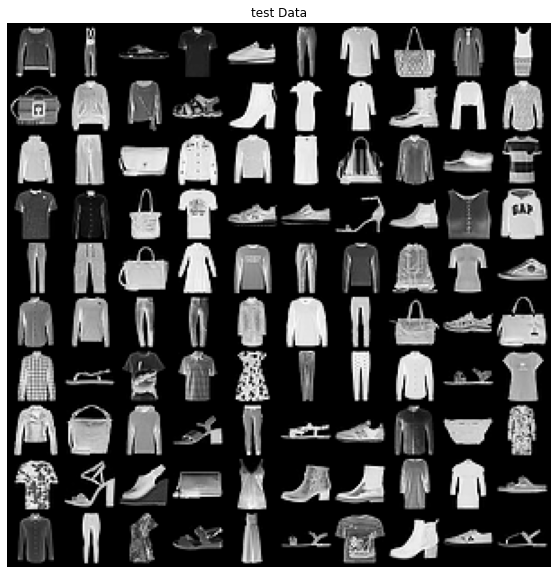

In [33]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = False, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

first_batch = next(iter(data_loader))

print(first_batch[0].shape)
#test code for the final one to learn how to translate and rotate the image
#unloader = transforms.ToPILImage() 
#loader = transforms.Compose([transforms.ToTensor()])
#d = unloder(first_batch[0][0,0,:,:])
#dd =transforms.functional.rotate(d,5)
#dd =transforms.functional.translate(d,5)
#ddd = loader(dd)


#dd= transforms.functional.affine(d,30,(10,5),1,0)
#ddd = loader(dd)

plot_images(first_batch[0], 10, 10, "test Data")
#img_1 = first_batch[0][0]
#img_1 = img_1.unsqueeze(0)
#print(img_1.shape)
#plot_images(ddd, 1, 1, "test Data")

The same grid of these images reconstructed by FullyConnected Autoencoder.

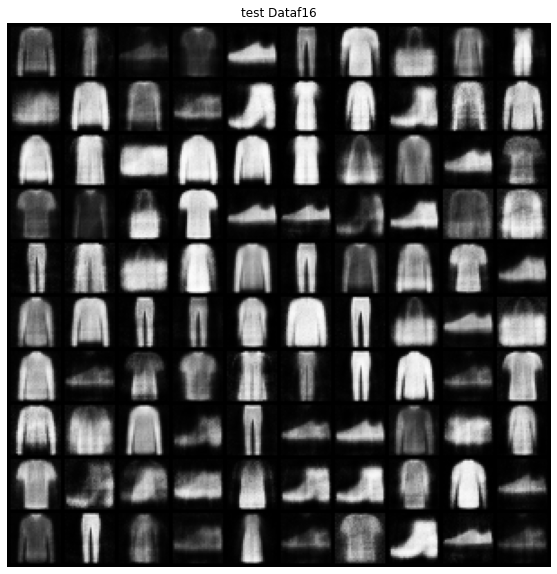

In [34]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        z = self.encoder(x)
        y = self.decoder(z)
        y = y.view(-1, 1, width, height)
        return y






def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

    
model = FullyConnectedAutoencoder(16)
model.load_state_dict(torch.load('fcAE16.pth', map_location=device))

output = model(first_batch[0])
output = output.detach()#important to cancel
#print(input[0])
#print(output)
#print(type(output))
#print(type(input[0]))
plot_images(output, 10, 10, "test Dataf16")

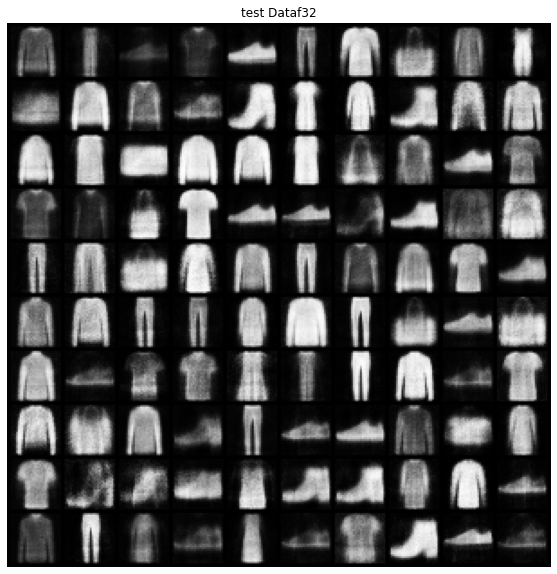

In [35]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        z = self.encoder(x)
        y = self.decoder(z)
        y = y.view(-1, 1, width, height)
        return y






def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

    
model = FullyConnectedAutoencoder(32)
model.load_state_dict(torch.load('fcAE32.pth', map_location=device))

output = model(first_batch[0])
output = output.detach()#important to cancel
#print(input[0])
#print(output)
#print(type(output))
#print(type(input[0]))
plot_images(output, 10, 10, "test Dataf32")

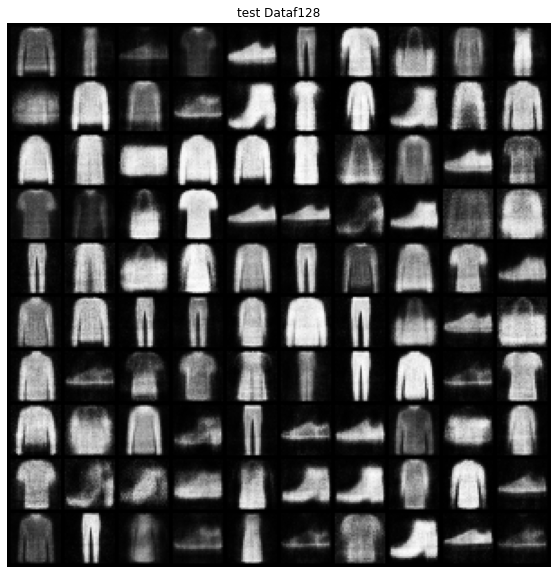

In [36]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        z = self.encoder(x)
        y = self.decoder(z)
        y = y.view(-1, 1, width, height)
        return y






def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

    
model3 = FullyConnectedAutoencoder(128)
model3.load_state_dict(torch.load('fcAE128.pth', map_location=device))

output = model3(first_batch[0])
output = output.detach()
#print(input[0])
#print(output)
#print(type(output))
#print(type(input[0]))
plot_images(output, 10, 10, "test Dataf128")

The same grid of these images reconstructed by convolutional Autoencoder.

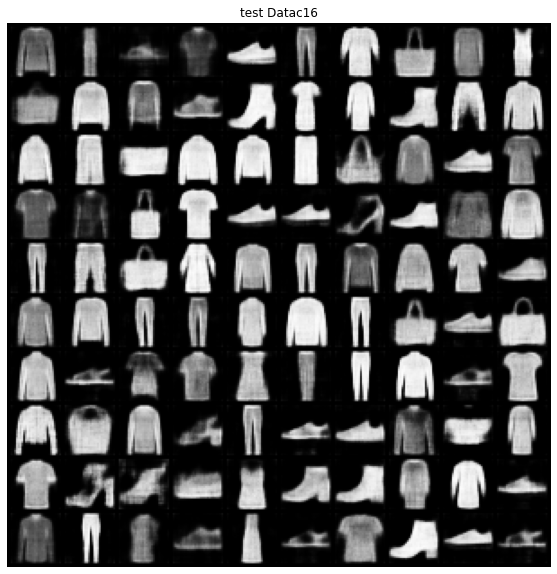

In [37]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        z = self.encoder(x)
        y = self.decoder(z)
        return y





def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

model = ConvolutionalAutoencoder(16)
model.load_state_dict(torch.load('convAE16.pth', map_location=device))

output = model(first_batch[0])
output = output.detach()

plot_images(output, 10, 10, "test Datac16")

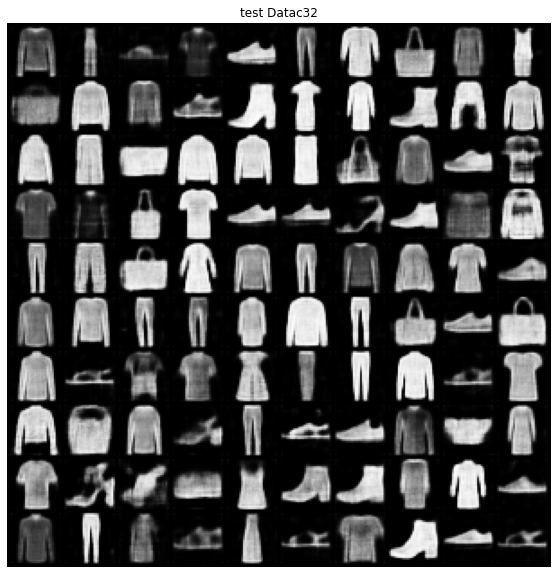

In [39]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        z = self.encoder(x)
        y = self.decoder(z)
        return y





def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

model3 = ConvolutionalAutoencoder(32)
model3.load_state_dict(torch.load('convAE32.pth', map_location=device))

output = model3(first_batch[0])
output = output.detach()

plot_images(output, 10, 10, "test Datac32")

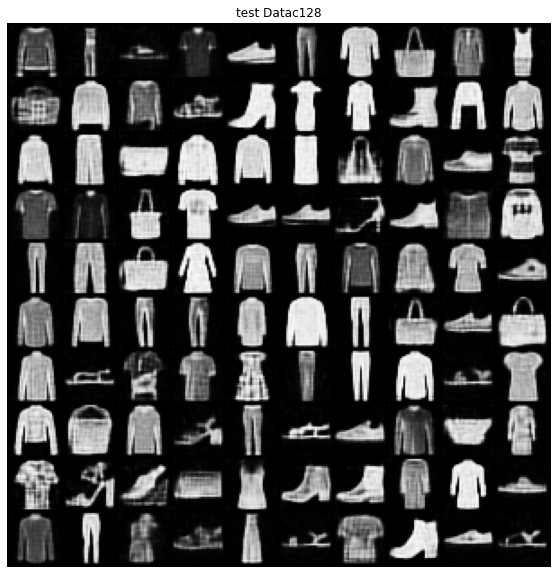

In [40]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        z = self.encoder(x)
        y = self.decoder(z)
        return y




def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

model3 = ConvolutionalAutoencoder(128)
model3.load_state_dict(torch.load('convAE128.pth', map_location=device))

output = model3(first_batch[0])
output = output.detach()

plot_images(output, 10, 10, "test Datac128")

Based on the qualitatively compare, convolutional layers can capture more features or say provide more clearly results comparing to fully-connected layers. The code dimension of fully-connected layers doesn't affects the clarity of the results too much, or say not that sensitive, while higher code dimension would make the results become more clear for convolutional layers.


3. PCA

I take use of some code used in last homework to make up the PCA function by myself.

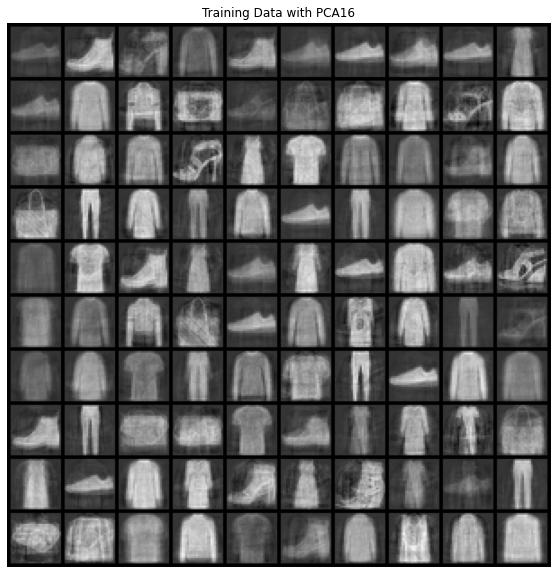

In [73]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def PCA(aaa,nc):
    N = aaa.shape[0]
    ii=aaa.shape[2]   # take the dimension of the matrix
    jj=aaa.shape[3]  
    kk=ii*jj
    S = np.zeros([kk,kk])
    v = np.zeros([N,kk])
    mean = np.zeros(kk)
    result = aaa
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                v[m,k] = aaa[m,0,i,j]
                k = k + 1
    for sk0 in range(kk):
        for m in range(N):
            mean[sk0] = mean[sk0] + v[m,sk0]
    mean = mean / kk
# get the cov matrix
    for m in range(N):
        for sk1 in range(kk):
            for sk2 in range(kk):
                S[sk1,sk2]=S[sk1,sk2] + (v[m,sk1]-mean[sk1])*(v[m,sk2]-mean[sk2])/(N-1)

    uuu,sigma,vvvt = np.linalg.svd(S)
#recover the original matrix
    data = np.dot(v,uuu[:,:nc])
    data = np.dot(data,np.transpose(uuu[:,:nc]))
    for m in range(N):
        for k in range(kk):
            data[m,k] = data[m,k] + mean[k]
    
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                k = i * ii + j
                result[m,0,i,j] = data[m,k]
    return result

    
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = True, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

input=next(iter(data_loader))
A = input[0].numpy()

i = A.shape[3]

B = PCA(A,16)

output = torch.from_numpy(B)
plot_images(output, 10, 10, "Training Data with PCA16")

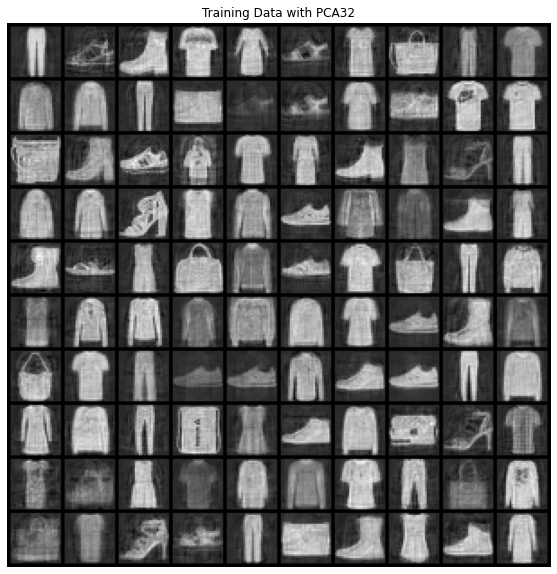

In [72]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def PCA(aaa,nc):
    N = aaa.shape[0]
    ii=aaa.shape[2]   # take the dimension of the matrix
    jj=aaa.shape[3]  
    kk=ii*jj
    S = np.zeros([kk,kk])
    v = np.zeros([N,kk])
    mean = np.zeros(kk)
    result = aaa
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                v[m,k] = aaa[m,0,i,j]
                k = k + 1
    for sk0 in range(kk):
        for m in range(N):
            mean[sk0] = mean[sk0] + v[m,sk0]
    mean = mean / kk
# get the cov matrix
    for m in range(N):
        for sk1 in range(kk):
            for sk2 in range(kk):
                S[sk1,sk2]=S[sk1,sk2] + (v[m,sk1]-mean[sk1])*(v[m,sk2]-mean[sk2])/(N-1)

    uuu,sigma,vvvt = np.linalg.svd(S)
    data = np.dot(v,uuu[:,:nc])
    data = np.dot(data,np.transpose(uuu[:,:nc]))
    for m in range(N):
        for k in range(kk):
            data[m,k] = data[m,k] + mean[k]
    
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                k = i * ii + j
                result[m,0,i,j] = data[m,k]
    return result
    
    
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = True, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

input=next(iter(data_loader))
A = input[0].numpy()

i = A.shape[3]
#print(i)
#print(input[0].size())

B = PCA(A,32)

output = torch.from_numpy(B)
plot_images(output, 10, 10, "Training Data with PCA32")

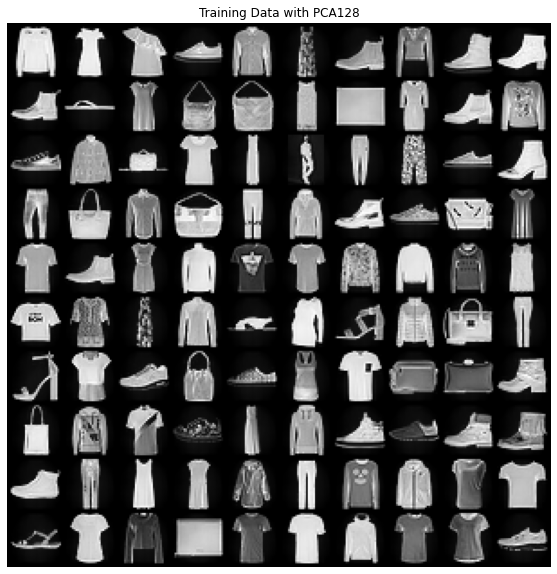

In [71]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

def PCA(aaa,nc):
    N = aaa.shape[0]
    ii=aaa.shape[2]   # take the dimension of the matrix
    jj=aaa.shape[3]  
    kk=ii*jj
    S = np.zeros([kk,kk])
    v = np.zeros([N,kk])
    mean = np.zeros(kk)
    result = aaa
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                v[m,k] = aaa[m,0,i,j]
                k = k + 1
    for sk0 in range(kk):
        for m in range(N):
            mean[sk0] = mean[sk0] + v[m,sk0]
    mean = mean / kk
# get the cov matrix
    for m in range(N):
        for sk1 in range(kk):
            for sk2 in range(kk):
                S[sk1,sk2]=S[sk1,sk2] + (v[m,sk1]-mean[sk1])*(v[m,sk2]-mean[sk2])/(N-1)

    uuu,sigma,vvvt = np.linalg.svd(S)
    data = np.dot(v,uuu[:,:nc])
    data = np.dot(data,np.transpose(uuu[:,:nc]))
    for m in range(N):
        for k in range(kk):
            data[m,k] = data[m,k] + mean[k]
    
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                k = i * ii + j
                result[m,0,i,j] = data[m,k]
    return result
    
    
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = True, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

input=next(iter(data_loader))
A = input[0].numpy()

i = A.shape[3]
#print(i)
#print(input[0].size())

B = PCA(A,128)

output = torch.from_numpy(B)
plot_images(output, 10, 10, "Training Data with PCA128")
    
    



As a result, I think the case reconstructed from PCA is not that bad especially for k=128...... For lower dimention, it performs not that good comparing to the autoencoder. Because basically PCA is for the linear space, it's totally a linear reduction of dimenisonality. This kind of results indicate that the data manifold generally is generally non-linear so that is hard to be captured by PCA which is a linear method but in this case it seems that some linear-like features still can be captured especially by the higher enough dimensional PCA.

4. 


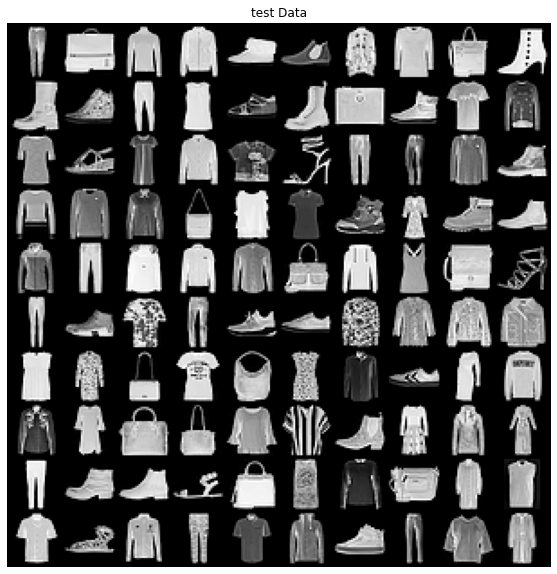

In [41]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = False, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

first_batch = next(iter(data_loader))
plot_images(first_batch[0], 10, 10, "test Data")

we select the first one and final one as the image we want to plot.

(100, 1, 28, 28)


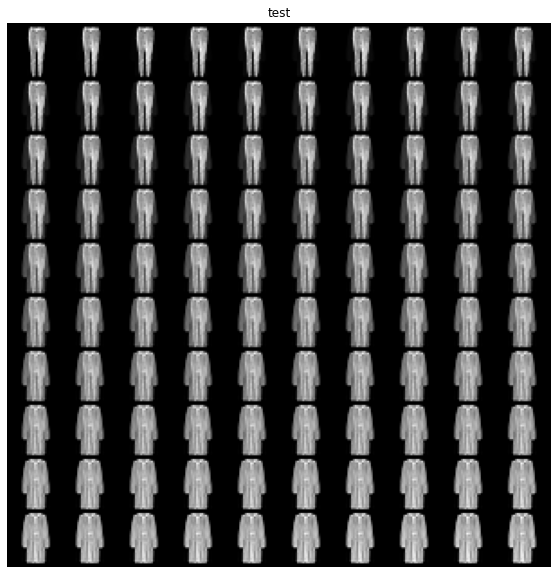

In [42]:
data = first_batch[0].numpy()
print(np.shape(data))
ini = data[0,0,:,:]
fin = data[99,0,:,:]
out = np.zeros([100,1,28,28])
for N in range(100):
    for i in range(28):
        for j in range(28):
            out[N,0,i,j] = N*(fin[i,j]-ini[i,j])/99 + ini[i,j]
output =  torch.from_numpy(out)

plot_images(output, 10, 10, "test")



Then select two similar picture, we get this one:

(100, 1, 28, 28)


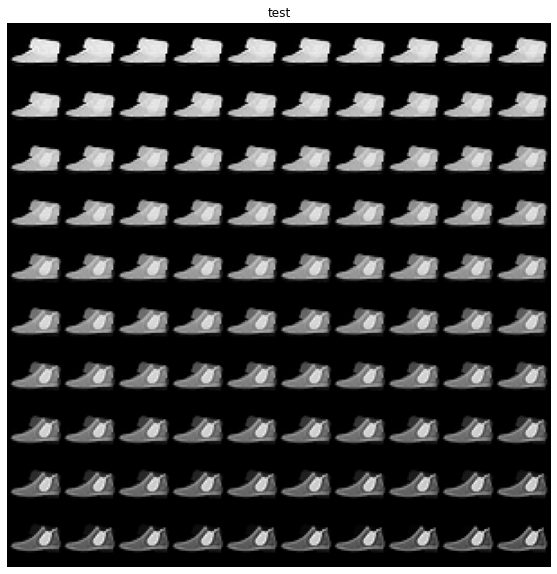

In [43]:
data = first_batch[0].numpy()
print(np.shape(data))
ini = data[4,0,:,:]
fin = data[5,0,:,:]
out = np.zeros([100,1,28,28])
for N in range(100):
    for i in range(28):
        for j in range(28):
            out[N,0,i,j] = N*(fin[i,j]-ini[i,j])/99 + ini[i,j]
output =  torch.from_numpy(out)

plot_images(output, 10, 10, "test")

Then we test the AE model.

First, we test the similar and different images within the fully connected model. I would like to test the similar and different images together with the installation in the forward function of the model.

Test first the different and second the similar images for fcAE16.

torch.Size([100, 16])
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       grad_fn=<SubBackward0>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       grad_fn=<SubBackward0>)


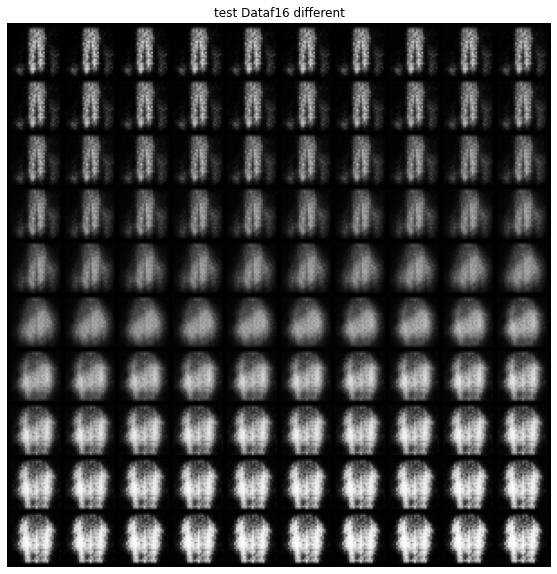

In [56]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        print(z.shape)
        
        data = z

        #print(data.shape)
        ini = data[0,:]
        #print(ini)
        fin = data[99,:]
                
        for N in range(100):
            for i in range(16):
                data[N,i] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)

        z = data
        
        print(z[0,:]-ini)
        print(z[99,:]-fin)
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    

model1 = FullyConnectedAutoencoder(16)
model1.load_state_dict(torch.load('fcAE16.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Dataf16 different")


tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       grad_fn=<SubBackward0>)
tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       grad_fn=<SubBackward0>)


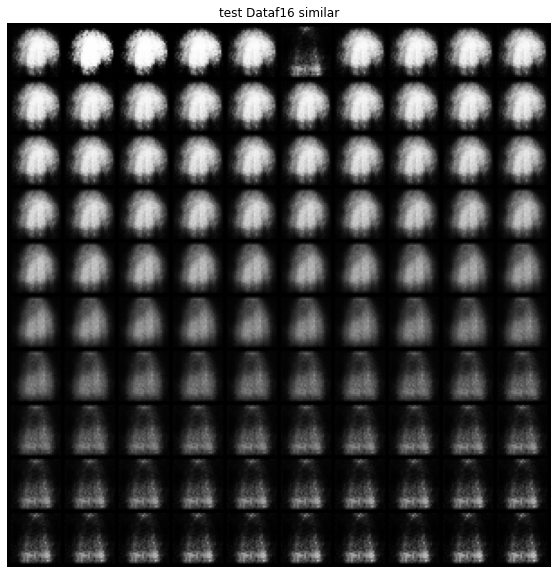

In [57]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        #print(z)
        
        data = z

        #print(data)
        ini = data[4,:]
        #print(ini)
        fin = data[5,:]
        
        
        for N in range(98):
            for i in range(16):
                data[N+1,i] = (N+1)*(fin[i]-ini[i])/99 + ini[i]
        data[0,:] =ini
        data[99,:] = fin
        z = data
        print(z[0,:]-ini)
        print(z[99,:]-fin)        
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    
    

model1 = FullyConnectedAutoencoder(16)
model1.load_state_dict(torch.load('fcAE16.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()#important to cancel
plot_images(output, 10, 10, "test Dataf16 similar")

Test first the different and second the similar images for fcAE32.

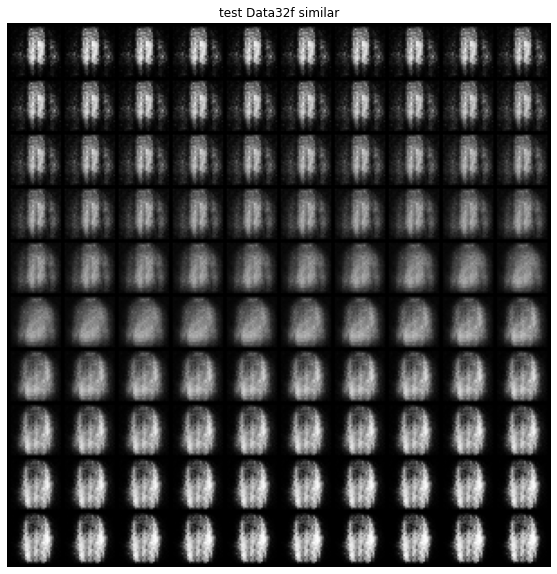

In [67]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        #print(z)
        
        data = z

        #print(data)
        ini = data[0,:]
        #print(ini)
        fin = data[99,:]
        
        
        for N in range(100):
            for i in range(32):
                data[N,i] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)
        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    

model1 = FullyConnectedAutoencoder(32)
model1.load_state_dict(torch.load('fcAE32.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()#important to cancel
plot_images(output, 10, 10, "test Data32f different")

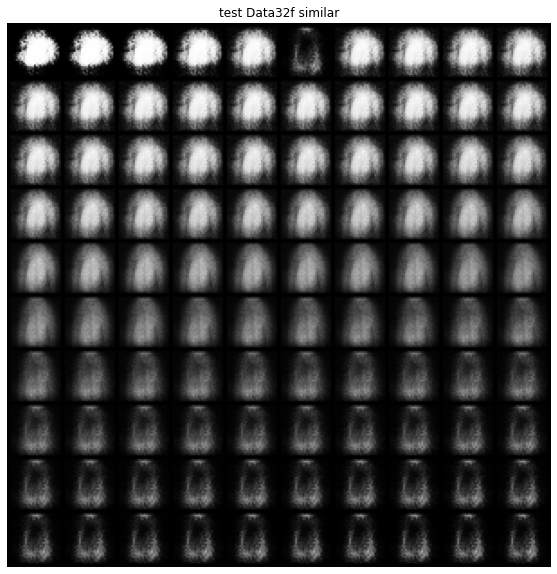

In [70]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        #print(z)
        
        data = z

        #print(data)
        ini = data[4,:]
        #print(ini)
        fin = data[5,:]
        
        
        for N in range(100):
            for i in range(32):
                data[N,i] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)
        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    

model1 = FullyConnectedAutoencoder(32)
model1.load_state_dict(torch.load('fcAE32.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()#important to cancel
plot_images(output, 10, 10, "test Data32f similar")

Test first the different and second the similar images for fcAE128.

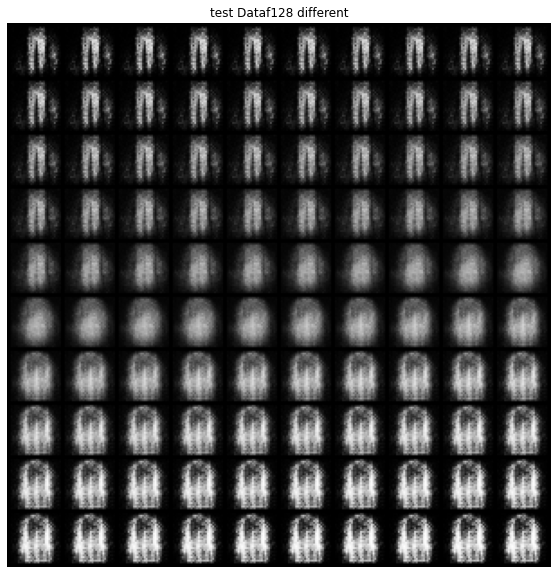

In [71]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        #print(z)
        
        data = z

        #print(data)
        ini = data[0,:]
        #print(ini)
        fin = data[99,:]
        
        
        for N in range(100):
            for i in range(128):
                data[N,i] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)
        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    

model1 = FullyConnectedAutoencoder(128)
model1.load_state_dict(torch.load('fcAE128.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()#important to cancel
plot_images(output, 10, 10, "test Dataf128 different")

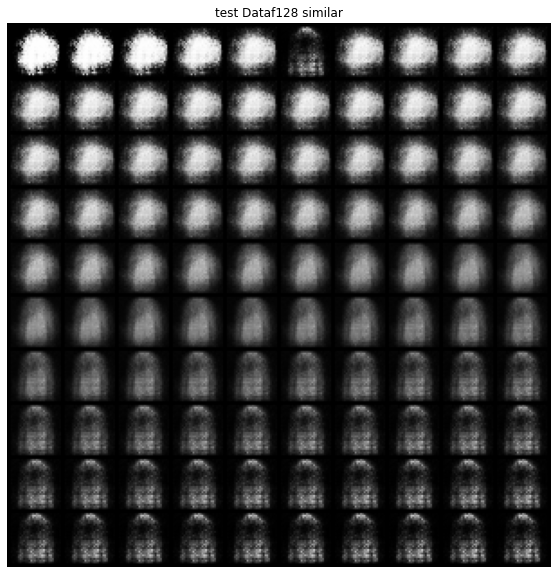

In [72]:
class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        #print(x)
        z = self.encoder(x)
        #print(z)
        
        data = z

        #print(data)
        ini = data[4,:]
        #print(ini)
        fin = data[5,:]
        
        
        for N in range(100):
            for i in range(128):
                data[N,i] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)
        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        y = y.view(-1, 1, width, height)
        #print(y.shape)
        return y


    

model1 = FullyConnectedAutoencoder(128)
model1.load_state_dict(torch.load('fcAE128.pth', map_location=device))
#model = ConvolutionalAutoencoder(32)
#model.load_state_dict(torch.load('convAE32.pth', map_location=device))

#print(input[0])
#print(input[0].shape)
output = model1(first_batch[0])
output = output.detach()#important to cancel
plot_images(output, 10, 10, "test Dataf128 similar")

Then ,let's test the similar and different images within the convolutional model.

Test first the different and second the similar images for convAE16.

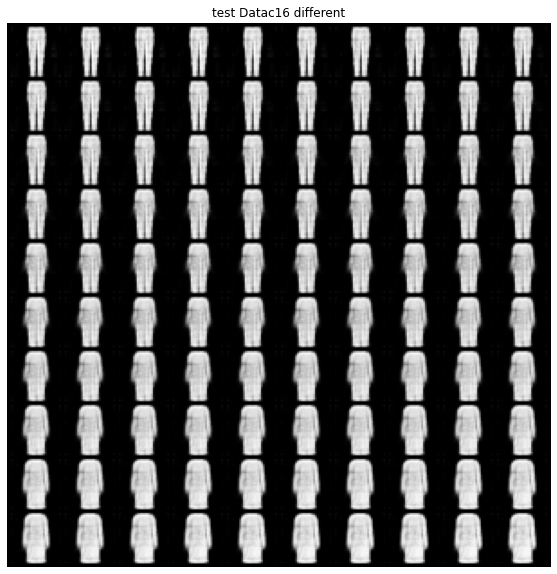

In [73]:


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[0,:,:,:]
        #print(ini)
        fin = data[99,:,:,:]
        for N in range(100):
            for i in range(16):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(16)
model.load_state_dict(torch.load('convAE16.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac16 different")

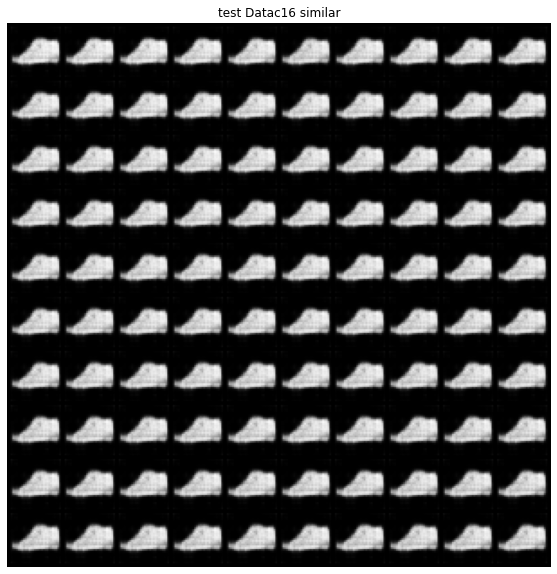

In [74]:


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[4,:,:,:]
        #print(ini)
        fin = data[5,:,:,:]
        for N in range(100):
            for i in range(16):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(16)
model.load_state_dict(torch.load('convAE16.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac16 similar")

Test first the different and second the similar images for convAE32.

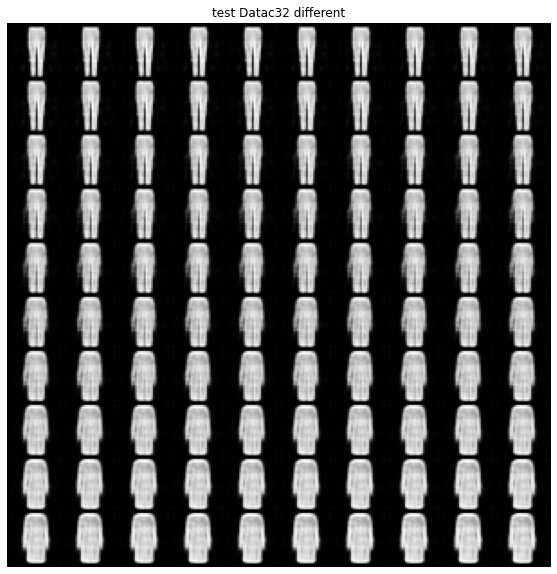

In [75]:


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[0,:,:,:]
        #print(ini)
        fin = data[99,:,:,:]
        for N in range(100):
            for i in range(32):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(32)
model.load_state_dict(torch.load('convAE32.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac32 different")

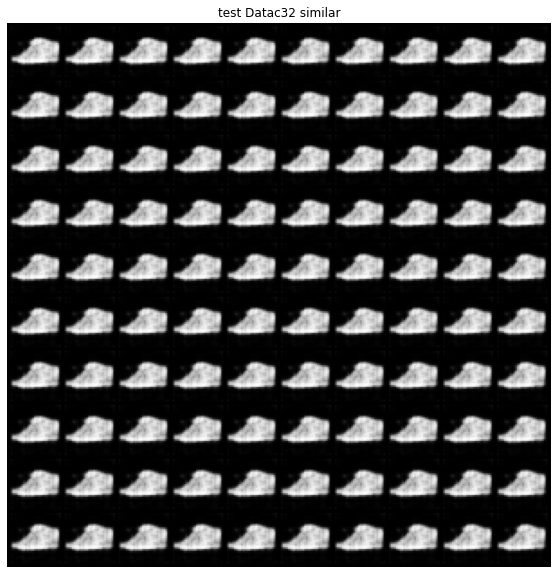

In [76]:


class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[4,:,:,:]
        #print(ini)
        fin = data[5,:,:,:]
        for N in range(100):
            for i in range(32):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(32)
model.load_state_dict(torch.load('convAE32.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac32 similar")

Test first the different and second the similar images for convAE128.

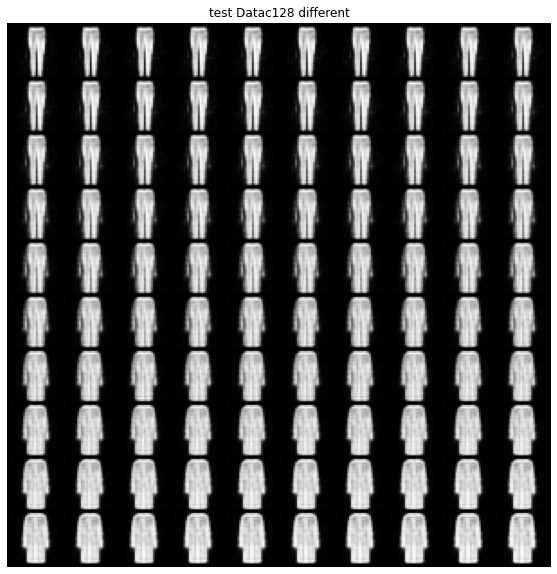

In [77]:

class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[0,:,:,:]
        #print(ini)
        fin = data[99,:,:,:]
        for N in range(100):
            for i in range(128):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(128)
model.load_state_dict(torch.load('convAE128.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac128 different")

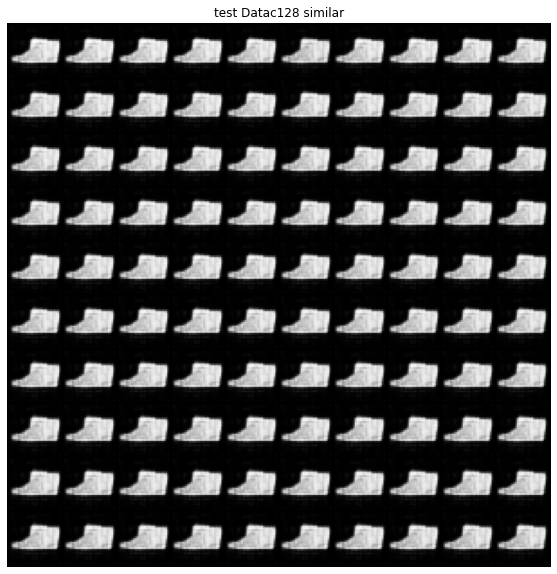

In [78]:

class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):
        #print(x.shape)
        z = self.encoder(x)
        #print(z.shape)
        data = z
        ini = data[4,:,:,:]
        #print(ini)
        fin = data[5,:,:,:]
        for N in range(100):
            for i in range(128):
                data[N,i,0,0] = N*(fin[i]-ini[i])/99 + ini[i]
        #print(data)                

        z = data
        
        y = self.decoder(z)
        #print(y.shape)
        return y
    
model = ConvolutionalAutoencoder(128)
model.load_state_dict(torch.load('convAE128.pth', map_location=device))


output = model(first_batch[0])
output = output.detach()
plot_images(output, 10, 10, "test Datac128 similar")

I think the results display that:

For the direct plotting of a sequence of images that are along the linear path between these two images, it just shows how the images gradually deformed from one to another.

For the sequence of images that are interpolated in the latent code space, actually the results are a little bit confused for me. 

For fully connencted AE, it seems this kind of linear interpolation can't clearly capture the feature of the images. The images for both different and similar cases are both not very clearly shown. Even the similar case would show some wired images within the sequence of images. The different case seems better for fully connected AE but still not that clear. This kind of linear "deformation" within the latent space of fully connected AE seems it can't capture the deformation of the images very clearly... 

However, for convolutional AE, all the linear interpolations are very clear. For the different images, this kind of sequence of images would gradually shown how the feature of images changed between two looks very different images during the linear interpolation within latent space. For the similar images, it will directly capture the similarities or say not very sensitive to the difference between the very similar images and looks good to correctly capture the key features for both similar and different cases.





5.

(a) 
for fully connected model,
the input dimension should be the number of pixel which is 28X28=784. If we want, we can multiple the number of figures as well. 
Then in each layers, it changes the dimensions from 784 to 256 to 128 to k=16,32,128 to acheive the reudction of dimensionality. Then in decoder part, it just reverses the case step by step.

for convolutional model, 
I am not familiary with that, but the input data is formed by 28X28=784 as well. Then each layer, the convolutional kernal layers have the dimension from the initial 784 to 32X24X24=18432 to 8X20X20=3200 but finally it should come to k=16,32,128 within the latent space to acheive the reduction of dimensionality. Then in decoder part, it just reverses the case step by step.


(b)
For fully connected model
the input and output dimensions satisfy the definition of submersion for encoder.
Based on my current understanding, if we don't know the rank of the weight matrix of each layer, the answer is no.
Because the activation function is monotonic increasing so that the derivative is positive and all other weighted matrix would multiple to each other to get the Jacobian matrix, we have to confirm the Jacobian matrix is full rank so that satisfies the definition of submersion.
However, even if we know the rank of weight matrix of each layer, we still can’t tell from the weights alone. Because the rank of the product of the matrices is always smaller or equal to the smallest one within the product, which I mean $rank(W_1,W_2) <=min(rank(W_1),rank(W_2))$. So we still can't determine whether it's full rank or not. Even if they are all full rank matrices, the product of the matrices can still have smaller rank which would violate the definition.
For fully connected model, if they are full rank matrices, it would monotonically decrease, but this would not affect the conclusion.





For convolutional model, 
the input and output dimensions satisfy the definition of submersion for encoder.
Based on my current understanding, if we don't know the rank of the weight matrix of each layer, the answer is no.
Because the activation function is monotonic increasing so that the derivative is positive and all other weighted matrix would multiple to each other to get the Jacobian matrix, we have to confirm the Jacobian matrix is full rank so that satisfies the definition of submersion.
However, even if we know the rank of weight matrix of each layer, we still can’t tell from the weights alone. Because the rank of the product of the matrices is always smaller or equal to the smallest one within the product, which I mean $rank(W_1,W_2) <=min(rank(W_1),rank(W_2))$. So we still can't determine whether it's full rank or not.
Even if they are all full rank matrices, the product of the matrices can still have smaller rank which would violate the definition.
For convolutional model, if they are full rank matrices, some matrices may have higher ranks due to the increasing of the dimensionality on some layers but this would not affect the conclusion I think.



(c)
For fully connected model
the input and output dimensions satisfy the definition of immersion for decoder.
Based on my current understanding, if we don't know the rank of the weight matrix of each layer, the answer is no.
Because the activation function is monotonic increasing so that the derivative is positive and all other weighted matrix would multiple to each other to get the Jacobian matrix, we have to confirm the Jacobian matrix is full rank so that satisfies the definition of immersion.
However, even if we know the rank of weight matrix of each layer, we still can’t tell from the weights alone. Because the rank of the product of the matrices is always smaller or equal to the smallest one within the product, which I mean $rank(W_1,W_2) <=min(rank(W_1),rank(W_2))$. So we still can't determine whether it's full rank or not.
Even if they are all full rank matrices, the product of the matrices can still have smaller rank which would violate the definition.
For fully connected model, if they are full rank matrices, it would monotonically increase, but this would not affect the conclusion.



For convolutional model, 
the input and output dimensions satisfy the definition of immersion for decoder.
Based on my current understanding, if we don't know the rank of the weight matrix of each layer, the answer is no.
Because the activation function is monotonic increasing so that the derivative is positive and all other weighted matrix would multiple to each other to get the Jacobian matrix, we have to confirm the Jacobian matrix is full rank so that satisfies the definition of immersion.
However, even if we know the rank of weight matrix of each layer, we still can’t tell from the weights alone. Because the rank of the product of the matrices is always smaller or equal to the smallest one within the product, which I mean $rank(W_1,W_2) <=min(rank(W_1),rank(W_2))$. So we still can't determine whether it's full rank or not.
Even if they are all full rank matrices, the product of the matrices can still have smaller rank which would violate the definition.
For convolutional model, if they are full rank matrices, some matrices may have higher ranks due to the increasing of the dimensionality on some layers but this would not affect the conclusion I think.


6.
To calculate the Jacobian matrix

The main difficulty here is how to use the autograd in Pytorch. The key idea is to make up a loop to generate the gradient.

First generate the data set.

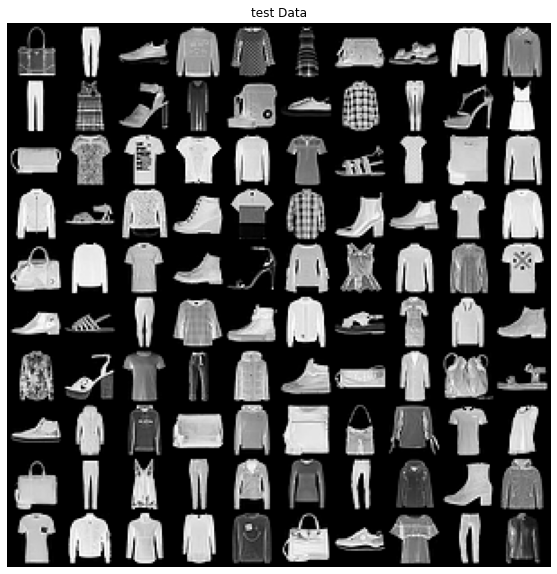

In [8]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 100
train_data = FashionMNIST("./data", train = False, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height

def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))

    
class ConvolutionalAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(ConvolutionalAutoencoder, self).__init__()
        self.econv1 = nn.Conv2d(1, 32, kernel_size = 5, bias = False)
        self.ebatch1 = nn.BatchNorm2d(32)
        self.econv2 = nn.Conv2d(32, 8, kernel_size = 5, bias = False)
        self.ebatch2 = nn.BatchNorm2d(8)
        self.econv3 = nn.Conv2d(8, out_size, kernel_size = 20, bias = True)

        self.dconv1 = nn.ConvTranspose2d(out_size, 8, kernel_size = 20, bias = True)
        self.dbatch1 = nn.BatchNorm2d(8)
        self.dconv2 = nn.ConvTranspose2d(8, 32, kernel_size = 5, bias = False)
        self.dbatch2 = nn.BatchNorm2d(32)
        self.dconv3 = nn.ConvTranspose2d(32, 1, kernel_size = 5, bias = False)

    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.econv1(x)))
        y2 = F.elu(self.ebatch2(self.econv2(y1)))
        z = F.elu(self.econv3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dconv1(z)))
        y2 = F.elu(self.dbatch2(self.dconv2(y1)))
        x = torch.sigmoid(self.dconv3(y2))
        return x
     
    def forward(self, x):

        z = self.encoder(x)   
        y = self.decoder(z)
        
        return y
    
    
    

    

class FullyConnectedAutoencoder(nn.Module):
    def __init__(self, out_size):
        super(FullyConnectedAutoencoder, self).__init__()
        self.elayer1 = nn.Linear(input_size, 256)
        self.ebatch1 = nn.BatchNorm1d(256)
        self.elayer2 = nn.Linear(256, 128)
        self.ebatch2 = nn.BatchNorm1d(128)
        self.elayer3 = nn.Linear(128, out_size)

        self.dlayer1 = nn.Linear(out_size, 128)
        self.dbatch1 = nn.BatchNorm1d(128)
        self.dlayer2 = nn.Linear(128, 256)
        self.dbatch2 = nn.BatchNorm1d(256)
        self.dlayer3 = nn.Linear(256, input_size)
    
    def encoder(self, x):
        y1 = F.elu(self.ebatch1(self.elayer1(x)))
        y2 = F.elu(self.ebatch2(self.elayer2(y1)))
        z = F.elu(self.elayer3(y2))
        return z

    def decoder(self, z):
        y1 = F.elu(self.dbatch1(self.dlayer1(z)))
        y2 = F.elu(self.dbatch2(self.dlayer2(y1)))
        x = torch.sigmoid(self.dlayer3(y2))
        return x
        
    def forward(self, x):
        x = x.view(-1, input_size)
        z = self.encoder(x)
        y = self.decoder(z)
        y = y.view(-1, 1, width, height)
        return y
    
    

    
first_batch = next(iter(data_loader))
plot_images(first_batch[0], 10, 10, "test Data")

In [72]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



def Jacobian(xx,model):
    #load model
    model.eval()
    with torch.no_grad():
        zz = model.encoder(xx.view(-1, input_size))
    model.train()
    zz.requires_grad_(True)
    yy = model.decoder(zz)

    #initialize jacobian
    jacobian = torch.zeros((100, 784, 16))
    #use this loop to calculate the gradient row by row to formulate the jacobian matrix
    for i in range(784):
        param = torch.zeros_like(yy)
        param[:,i] = 1
        yy.backward(param, retain_graph = True)
        jacobian[:,i,:] = zz.grad.data
        zz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack
    
    
    
model = FullyConnectedAutoencoder(16)
model.load_state_dict(torch.load('fcAE16.pth', map_location=device))



#img_1 = first_batch[0][0]
#img_1 = img_1.unsqueeze(0)
Jackf1=Jacobian(first_batch[0],model)

R1=np.linalg.matrix_rank(Jackf1[0])

uuuu,sigma1,vvvvt = np.linalg.svd(Jackf1[0])

print(sigma1[0]) #max singular value
print(sigma1[15])#min singular value
print(R1) #rank





5.7660174
0.86205053
16


The results indicate the Jacobian here for fcAE16 is full rank and the decoder of it is an immersion at this point.

In [73]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



def Jacobian(xx,model):
    #load model
    model.eval()
    with torch.no_grad():
        zz = model.encoder(xx.view(-1, input_size))
    model.train()
    zz.requires_grad_(True)
    yy = model.decoder(zz)
    #initialize jacobian
    jacobian = torch.zeros((100,784,32))
    #use loops to calculate the gradient to formulate the jacobian matrix
    for i in range(784):
        param = torch.zeros_like(yy)
        param[:,i] = 1
        yy.backward(param, retain_graph = True)
        jacobian[:,i,:] = zz.grad.data
        zz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack
    
    
    
model = FullyConnectedAutoencoder(32)
model.load_state_dict(torch.load('fcAE32.pth', map_location=device))



#img_1 = first_batch[0][0]
#img_1 = img_1.unsqueeze(0)
Jackf2=Jacobian(first_batch[0],model)
#print(Jackf2.shape)


R2=np.linalg.matrix_rank(Jackf2[0])

uuuu,sigma2,vvvvt = np.linalg.svd(Jackf2[0])

print(sigma2[0])
print(sigma2[31])
print(R2)


4.433703
0.26066482
32


The results indicate the Jacobian here for fcAE32 is full rank and the decoder of it is an immersion at this point.

In [77]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



def Jacobian(xx,model):
    #load model
    model.eval()
    with torch.no_grad():
        zz = model.encoder(xx.view(-1, input_size))
    model.train()
    zz.requires_grad_(True)
    yy = model.decoder(zz)
    #initialize jacobian
    jacobian = torch.zeros((100,784,128))
    #use loops to calculate the gradient to formulate the jacobian matrix
    for i in range(784):
        param = torch.zeros_like(yy)
        param[:,i] = 1
        yy.backward(param, retain_graph = True)
        jacobian[:,i,:] = zz.grad.data
        zz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack
    
    
    
model = FullyConnectedAutoencoder(128)
model.load_state_dict(torch.load('fcAE128.pth', map_location=device))



#img_1 = first_batch[0][0]
#img_1 = img_1.unsqueeze(0)
Jackf3=Jacobian(first_batch[0],model)
#print(Jackf3.shape)

R3=np.linalg.matrix_rank(Jackf3[0])

uuuu,sigma3,vvvvt = np.linalg.svd(Jackf3[0])

print(sigma3[0])
print(sigma3[127])
print(R3)


3.4550772
2.083063e-06
126


The results indicate the Jacobian here for fcAE128 is not full rank and the decoder of it is not an immersion at this point. The min singular value maybe close enough to say it's 0 and this also indicate it's not full rank so that not an immersion at this point. This looks wired and I am not sure whether there is any problem here......

In [78]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


    
    
def Jacobian(xxx,model):
    #print(xxx.shape)
    model.eval()
    with torch.no_grad():
        zzz = model.encoder(xxx)
    model.train()
    #print(zzz.shape)
    zzz.requires_grad_(True)
    yyy = model.decoder(zzz)
    #print(yyy.shape)
    
    jacobian = torch.zeros((100,784,16))
    #print(jacobian.shape)
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            param = torch.zeros_like(yyy)
            param[:,:,i,j] = 1
            yyy.backward(param, retain_graph = True)
            jacobian[:,k,:] = zzz.grad.data[:,:,0,0]
            zzz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack


    
model = ConvolutionalAutoencoder(16)
model.load_state_dict(torch.load('convAE16.pth', map_location=device))


Jackc1=Jacobian(first_batch[0],model)


R4=np.linalg.matrix_rank(Jackc1[0])

uuuu,sigma4,vvvvt = np.linalg.svd(Jackc1[0])

print(sigma4[0])
print(sigma4[15])
print(R4)




7.3899374
1.894632
16


The results indicate the Jacobian here for convAE16 is full rank and the decoder of it is an immersion at this point.

In [79]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


    
    
def Jacobian(xxx,model):
    #print(xxx.shape)
    model.eval()
    with torch.no_grad():
        zzz = model.encoder(xxx)
    model.train()
    #print(zzz.shape)
    zzz.requires_grad_(True)
    yyy = model.decoder(zzz)
    #print(yyy.shape)
    
    jacobian = torch.zeros((100,784,32))
    #print(jacobian.shape)
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            param = torch.zeros_like(yyy)
            param[:,:,i,j] = 1
            yyy.backward(param, retain_graph = True)
            jacobian[:,k,:] = zzz.grad.data[:,:,0,0]
            zzz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack


    
model = ConvolutionalAutoencoder(32)
model.load_state_dict(torch.load('convAE32.pth', map_location=device))


Jackc2=Jacobian(first_batch[0],model)

R5=np.linalg.matrix_rank(Jackc2[0])

uuuu,sigma5,vvvvt = np.linalg.svd(Jackc2[0])

print(sigma5[0])
print(sigma5[31])
print(R5)


5.671843
0.7739169
32


The results indicate the Jacobian here for convAE32 is full rank and the decoder of it is an immersion at this point.

In [80]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


    
    
def Jacobian(xxx,model):

    model.eval()
    with torch.no_grad():
        zzz = model.encoder(xxx)
    model.train()

    zzz.requires_grad_(True)
    yyy = model.decoder(zzz)

    
    jacobian = torch.zeros((100,784,128))

    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            param = torch.zeros_like(yyy)
            param[:,:,i,j] = 1
            yyy.backward(param, retain_graph = True)
            jacobian[:,k,:] = zzz.grad.data[:,:,0,0]
            zzz.grad.data.zero_()
    jack = jacobian.numpy()
    return jack


    
model = ConvolutionalAutoencoder(128)
model.load_state_dict(torch.load('convAE128.pth', map_location=device))


Jackc3=Jacobian(first_batch[0],model)


R6=np.linalg.matrix_rank(Jackc3[0])

uuuu,sigma6,vvvvt = np.linalg.svd(Jackc3[0])

print(sigma6[0])
print(sigma6[127])
print(R6)

7.65878
0.4583957
128


The results indicate the Jacobian here for convAE128 is full rank and the decoder of it is an immersion at this point.

7

First of all, for the AE model, the tangent vector can be seen as the column of the Jacobian matrix, so just call the Jacobian function again to calculate the corresponding vectors to see the images.

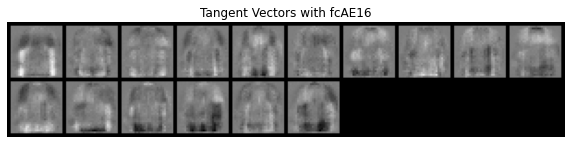

In [147]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf1 = np.zeros([16,1,28,28])
for N in range(16):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf1[N,0,i,j] = Jackf1[0,k,N] 



output1 = torch.from_numpy(tvf1)




plot_images(output1, 10, 10, "Tangent Vectors with fcAE16")


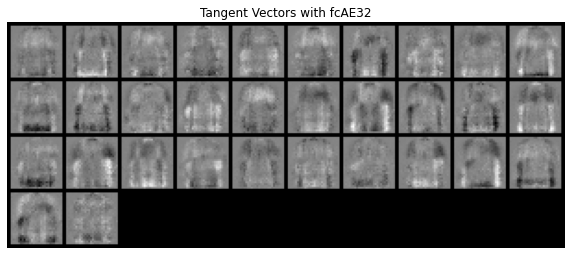

In [57]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf2 = np.zeros([32,1,28,28])
for N in range(32):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf2[N,0,i,j] = Jackf2[0,k,N] 



output2 = torch.from_numpy(tvf2)




plot_images(output2, 10, 10, "Tangent Vectors with fcAE32")

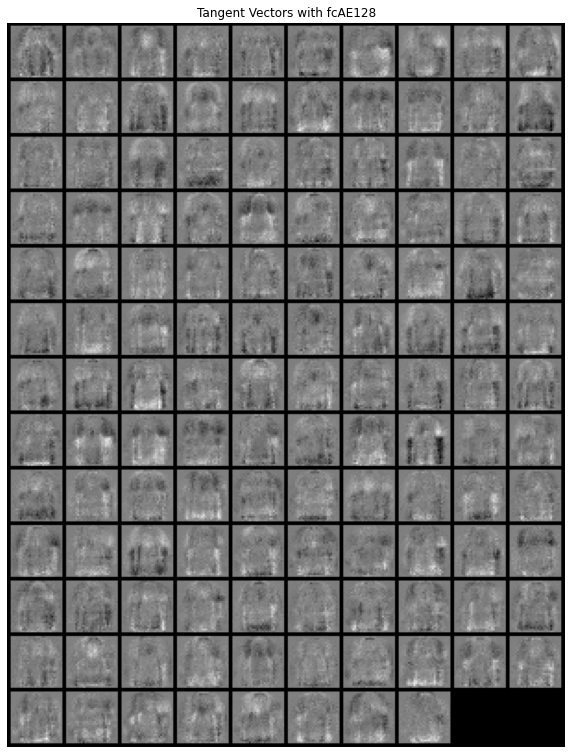

In [58]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf3 = np.zeros([128,1,28,28])
for N in range(128):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf3[N,0,i,j] = Jackf3[0,k,N] 



output3 = torch.from_numpy(tvf3)




plot_images(output3, 10, 20, "Tangent Vectors with fcAE128")

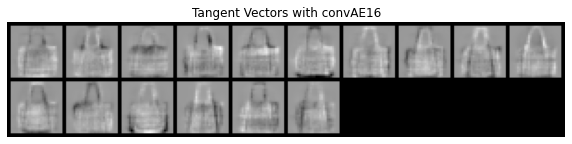

In [68]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc1 = np.zeros([16,1,28,28])
for N in range(16):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc1[N,0,i,j] = Jackc1[0,k,N] 



output1 = torch.from_numpy(tvc1)




plot_images(output1, 10, 10, "Tangent Vectors with convAE16")

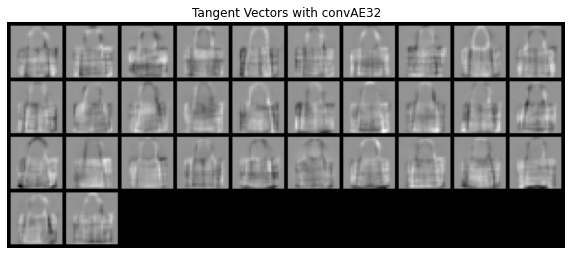

In [83]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc2 = np.zeros([32,1,28,28])
for N in range(32):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc2[N,0,i,j] = Jackc2[0,k,N] 



output2 = torch.from_numpy(tvc2)




plot_images(output2, 10, 10, "Tangent Vectors with convAE32")

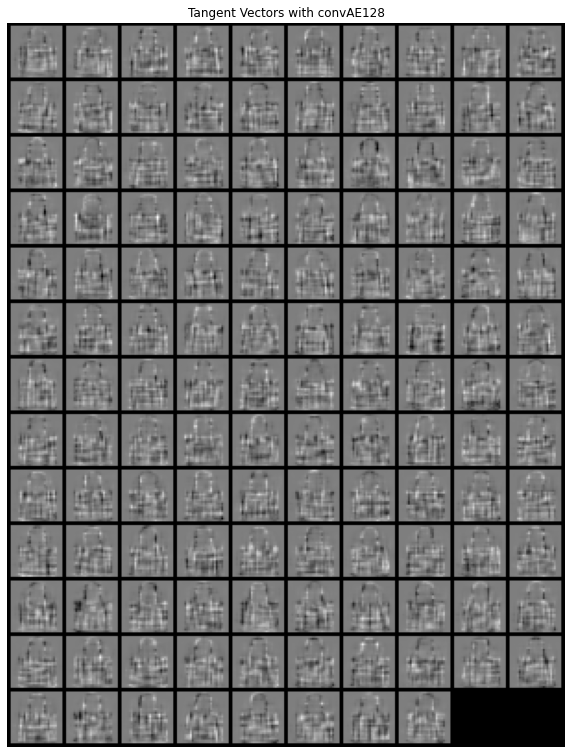

In [84]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc3 = np.zeros([128,1,28,28])
for N in range(128):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc3[N,0,i,j] = Jackc3[0,k,N] 



output3 = torch.from_numpy(tvc3)




plot_images(output3, 10, 20, "Tangent Vectors with convAE128")

Let's then check PCA's case, the tangent vector here should be the eigenvector calculate through SVD.

(784, 784)
(784, 128)
(128, 784)


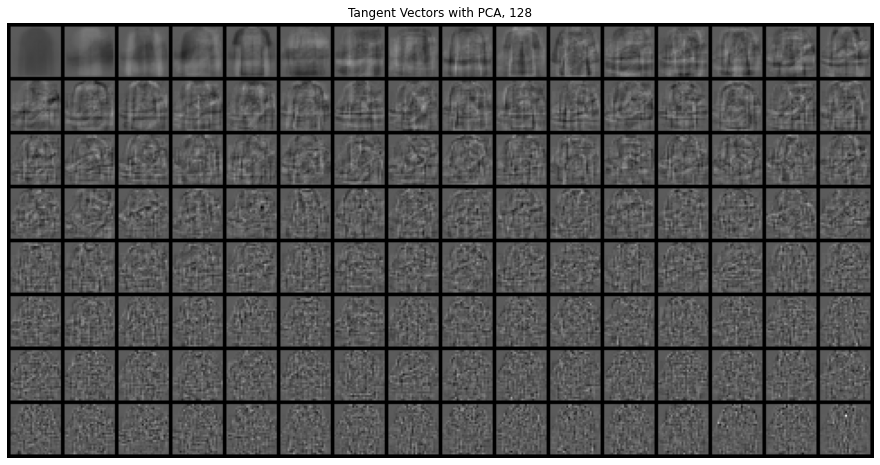

In [156]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_size = 128
train_data = FashionMNIST("./data", train = True, download = True,
                          transform=transforms.ToTensor())
data_loader = DataLoader(train_data, batch_size = batch_size, shuffle = True)

width = 28
height = 28
input_size = width * height




def PCA(aaa,nc):
    N = aaa.shape[0]
    ii=aaa.shape[2]   # take the dimension of the matrix
    jj=aaa.shape[3]  
    kk=ii*jj
    S = np.zeros([kk,kk])
    v = np.zeros([N,kk])
    mean = np.zeros(kk)
    result = aaa
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                v[m,k] = aaa[m,0,i,j]
                k = k + 1
    for sk0 in range(kk):
        for m in range(N):
            mean[sk0] = mean[sk0] + v[m,sk0]
    mean = mean / kk
# get the cov matrix
    for m in range(N):
        for sk1 in range(kk):
            for sk2 in range(kk):
                S[sk1,sk2]=S[sk1,sk2] + (v[m,sk1]-mean[sk1])*(v[m,sk2]-mean[sk2])/(N-1)

    uuu,sigma,vvvt = np.linalg.svd(S)
    data = np.transpose(uuu[:,:nc])
    
    print(uuu.shape)
    print(uuu[:,:nc].shape)
    print(data.shape)
    
    for m in range(N):
        k = 0
        for i in range(ii):
            for j in range(jj):
                k = i * ii + j
                result[m,0,i,j] = data[m,k]
    return result

    

first_batch = next(iter(data_loader))

A = first_batch[0].numpy()

i = A.shape[3]
#print(i)
#print(input[0].size())

B2 = PCA(A,128)

output = torch.from_numpy(B2)
plot_images(output, 16, 8, "Tangent Vectors with PCA, 128")

Change the base image and check the results for the autoencoder model again. We don't need to check the PCA because PCA's tangent vectors should be the same for all the base images or say it's independent with the base image.

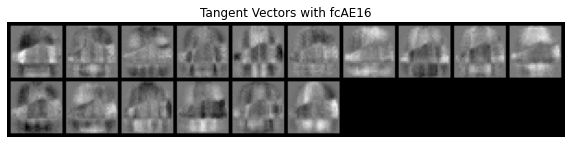

In [87]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf1 = np.zeros([16,1,28,28])
for N in range(16):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf1[N,0,i,j] = Jackf1[7,k,N] 



output1 = torch.from_numpy(tvf1)




plot_images(output1, 10, 10, "Tangent Vectors with fcAE16")

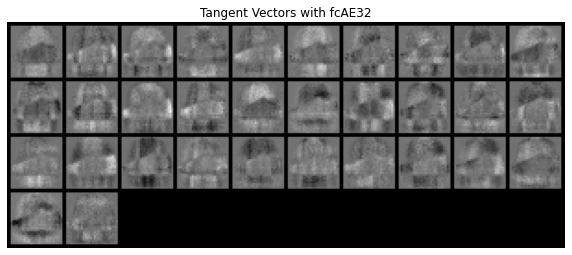

In [88]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf2 = np.zeros([32,1,28,28])
for N in range(32):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf2[N,0,i,j] = Jackf2[7,k,N] 



output2 = torch.from_numpy(tvf2)




plot_images(output2, 10, 10, "Tangent Vectors with fcAE32")

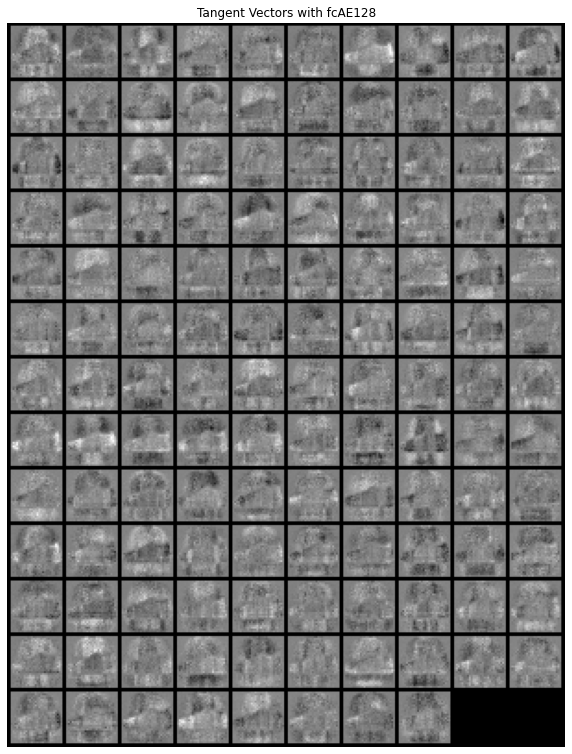

In [91]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvf3 = np.zeros([128,1,28,28])
for N in range(128):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvf3[N,0,i,j] = Jackf3[7,k,N] 



output3 = torch.from_numpy(tvf3)




plot_images(output3, 10, 20, "Tangent Vectors with fcAE128")

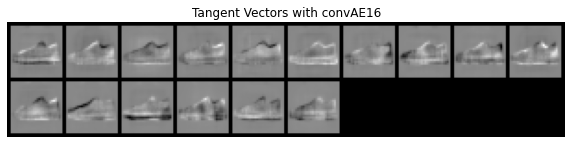

In [92]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc1 = np.zeros([16,1,28,28])
for N in range(16):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc1[N,0,i,j] = Jackc1[7,k,N] 



output1 = torch.from_numpy(tvc1)




plot_images(output1, 10, 10, "Tangent Vectors with convAE16")

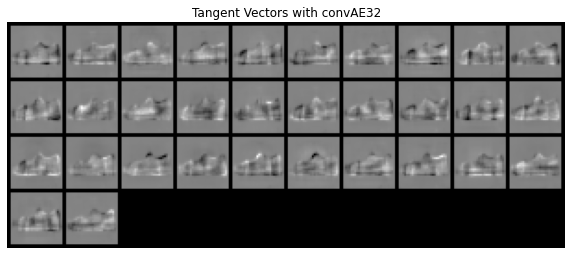

In [89]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc2 = np.zeros([32,1,28,28])
for N in range(32):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc2[N,0,i,j] = Jackc2[7,k,N] 



output2 = torch.from_numpy(tvc2)




plot_images(output2, 10, 10, "Tangent Vectors with convAE32")

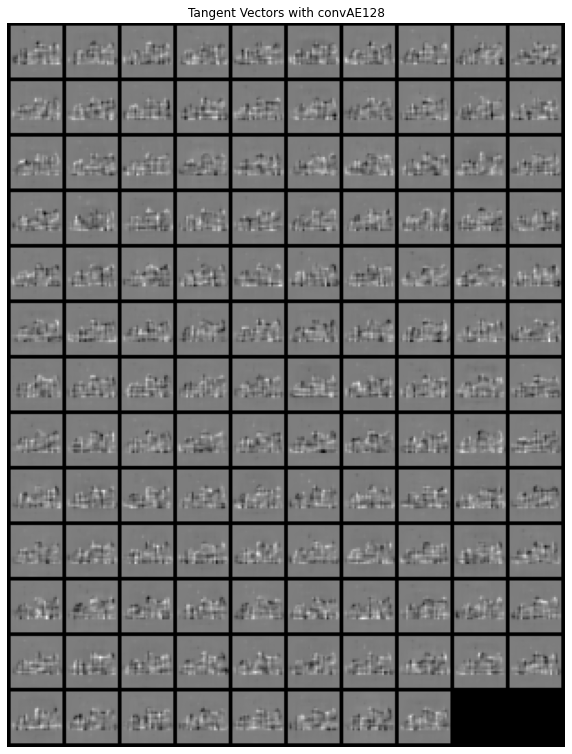

In [90]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc3 = np.zeros([128,1,28,28])
for N in range(128):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc3[N,0,i,j] = Jackc3[7,k,N] 



output3 = torch.from_numpy(tvc3)




plot_images(output3, 10, 20, "Tangent Vectors with convAE128")

Based on all calculated results, we can see that:

For autoencoder model

1. The fully connected model's tangent vectors looks messy and can't see the clear connection between the tangent vector and the base point image. But it does change with the base point.


2. The convolutional model's results look very nice. It looks exactly just like a difference between the deformed image and the base point image. It can reflect the feature of the base point iamge's feature. Besides, it would change with the base point image which makes sense.

For PCA

3.it looks like messy and can't see the clear connection between the tangent vector and the base point image. Besides, it does't change with the change of the base point image and is all the same for all base point images.

We take use of the convAE32 as an example to see how the tangent vectors change the base point image by adding them up.

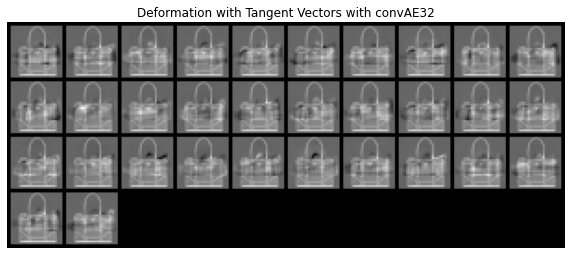

In [155]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



tvc2 = np.zeros([32,1,28,28])
test = np.zeros([32,1,28,28])
for N in range(32):
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            tvc2[N,0,i,j] = Jackc2[7,k,N] 
    test[N,0,:,:] = tvc2[N,0,:,:] + first_batch[0][0,0,:,:].numpy()

outputtest = torch.from_numpy(test)




plot_images(outputtest, 10, 10, "Deformation with Tangent Vectors with convAE32")





The results indicates what I mentioned above that the convolutional autoencoder model can be seen clearly its tangent vector respect to the latent dimentions is just a clear deformation along one direction of the data manifold. The results provide the image deformed along the tangent vector through the manifold. This is exactly what we expect here.

8. group action

Firstly, let's deal with the group action calculation, we just use the [transforms.functional.affine] to produce all the translation or rotation and get the Lie group related tangent vectors. I also provide the plotting for the transformation image to check whether it's correct.

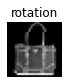

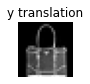

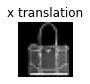

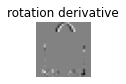

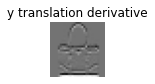

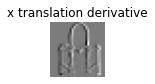

In [144]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


unloader = transforms.ToPILImage()
loader = transforms.Compose([transforms.ToTensor()])


original = first_batch[0][0,0,:,:]
#print(first_batch[0][0,0,:,:].shape)
d = unloader(first_batch[0][0,0,:,:])
#dd =transforms.functional.rotate(d,5)

#calculate the rotation, translation with different axis
dd1 = transforms.functional.affine(d,3,(0,0),1,0)
dd2 = transforms.functional.affine(d,0,(0,1),1,0)
dd3 = transforms.functional.affine(d,0,(1,0),1,0)
ddd1 = loader(dd1)
ddd2 = loader(dd2)
ddd3 = loader(dd3)



#perform the discrete difference to do the derivative
X1 = (ddd1-original)/3
X2 = (ddd2-original)/1
X3 = (ddd3-original)/1


#print(ddd1.shape)
#print(ddd2.shape)
#print(ddd3.shape)


plot_images(ddd1, 1, 1, "rotation")
plot_images(ddd2, 1, 1, "y translation")
plot_images(ddd3, 1, 1, "x translation")


#print(X1.shape)
#print(X2.shape)
#print(X3.shape)
plot_images(X1, 1, 1, "rotation derivative")
plot_images(X2, 1, 1, "y translation derivative")
plot_images(X3, 1, 1, "x translation derivative")


X1 = X1.numpy()
X1a = np.zeros([784])
X2 = X2.numpy()
X2a = np.zeros([784])
X3 = X3.numpy()
X3a = np.zeros([784])
#flatten the X1
for i in range(28):
    for j in range(28):
        k = i * 28 +j
        X1a[k] = X1[0,i,j]
        X2a[k] = X2[0,i,j]
        X3a[k] = X3[0,i,j]
        


Then we calculate the angle between the Lie group related tangent vector or action to see whether they are exactly lying within the tangent space or not. I am going to check the angle between the vector and its projection.


Note: I also produce the singular values to double-check the dimensionality and the other three more values represent the angles calculated for three different Lie group actions, rotation and two different translation in 2D.

In [146]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


#perform the projection and get the angle. the idea is to take the inner product between the vector X and basis, 
#then get the projection of X onto the orthorgonal base vecotrs and then sum them up to get the projection of the X onto
#the tangent space, then measure the angle between this projection and original vector by using inner product divide the 
#lengths of both vectors and send it into arccos function.
def Proj1(X,hyper,dd):
    projection = 0
    for i in range(dd):
        projection = projection + np.dot(X,hyper[i,:])*hyper[i,:]/np.linalg.norm(hyper[i,:])/np.linalg.norm(hyper[i,:])
    #print(projection)
    #print(np.linalg.norm(projection))
    #print(np.linalg.norm(X))
    inner = np.dot(X,projection)/np.linalg.norm(X)/np.linalg.norm(projection)
    #print(np.dot(X,projection))
    #print(inner)
    degree = np.arccos(inner)
    return degree


#perfrom the PCA for the tangent vectors from Jacobian to formulate the orthorgonal base vectors for the tangent 
#space spanned by the Jacobian's column vectors.
def PCAA(X,N):
    kk = 784
    S = np.zeros([kk,kk])
    v = np.transpose(X)
    mean = np.zeros(kk)
    for sk0 in range(kk):
        for m in range(N):
            mean[sk0] = mean[sk0] + v[m,sk0]
    mean = mean / kk
# get the cov matrix
    for m in range(N):
        for sk1 in range(kk):
            for sk2 in range(kk):
                S[sk1,sk2]=S[sk1,sk2] + (v[m,sk1]-mean[sk1])*(v[m,sk2]-mean[sk2])/(N-1)

    uuu,sigma,vvvt = np.linalg.svd(S)
    data = np.transpose(uuu[:,:N])

    print(sigma)
    return data





hyperplane1 = PCAA(Jackf1[0],16)


degreeforX1 = Proj1(X1a,hyperplane1,16)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane1,16)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane1,16)
print(degreeforX3)



[2.21642517e+00 1.27270474e+00 8.57165763e-01 6.16051214e-01
 5.16227431e-01 4.39560965e-01 3.72747472e-01 2.61156901e-01
 2.02431065e-01 1.85712194e-01 1.64071722e-01 1.21802600e-01
 8.71822327e-02 7.60396721e-02 6.12618333e-02 4.95293881e-02
 6.61488849e-16 4.80809972e-16 4.52241930e-16 3.50751148e-16
 3.07356975e-16 2.94249079e-16 2.64718797e-16 2.45888573e-16
 1.92285018e-16 1.86281157e-16 1.54280786e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.49950055e-16 1.49950055e-16 1.49950055e-16
 1.49950055e-16 1.499500

As we can see for this case (fcAE16) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.472475002153181(84 degree)

the y-translation related tangent vector has the angle about 1.2856241902923418(74 degree)

the x-translation related tangent vector has the angle about 1.3390710155697896(76 degree)

This indicates they are out of that tangent space.


In [135]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



hyperplane2 = PCAA(Jackf2[0],32)


degreeforX1 = Proj1(X1a,hyperplane2,32)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane2,32)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane2,32)
print(degreeforX3)



[6.33903347e-01 5.71498964e-01 1.85682082e-01 1.60451641e-01
 1.25192792e-01 1.20689868e-01 9.31129139e-02 8.46356500e-02
 5.97102659e-02 4.80105868e-02 4.30722364e-02 3.68503101e-02
 3.27869576e-02 3.21902822e-02 2.20832085e-02 2.05207128e-02
 1.63933972e-02 1.62767320e-02 1.46718557e-02 1.37526412e-02
 1.25194300e-02 1.00861306e-02 9.49785054e-03 7.41036816e-03
 6.46951811e-03 5.42614551e-03 4.82533124e-03 4.30081824e-03
 3.84446475e-03 3.77600768e-03 2.84391191e-03 2.18401505e-03
 3.01290970e-16 1.80380749e-16 1.62202229e-16 1.24067012e-16
 1.10016154e-16 9.12638137e-17 8.74430908e-17 8.13347589e-17
 5.96170036e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.99349362e-17 4.99349362e-17 4.99349362e-17
 4.99349362e-17 4.993493

As we can see for this case (fcAE32) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.3434204086842911(77 degree)

the y-translation related tangent vector has the angle about 1.1829383782834724(68 degree)

the x-translation related tangent vector has the angle about 1.3077182107772203(75 degree)

This indicates they are out of that tangent space.

In [138]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



hyperplane3 = PCAA(Jackf3[0],128)


degreeforX1 = Proj1(X1a,hyperplane3,128)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane3,128)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane3,128)
print(degreeforX3)



[9.39289453e-02 5.68939474e-02 3.18478060e-02 2.66803495e-02
 2.24490179e-02 2.23188553e-02 1.68175663e-02 1.40319337e-02
 1.24316905e-02 1.16778951e-02 1.03494393e-02 9.05236295e-03
 8.91796767e-03 8.28965794e-03 5.71095536e-03 5.42735200e-03
 4.85598332e-03 4.74411986e-03 4.47067914e-03 4.14040093e-03
 3.68708130e-03 3.40798092e-03 3.17804360e-03 2.92182218e-03
 2.66423089e-03 2.46152367e-03 2.42611480e-03 2.31756751e-03
 2.23235641e-03 2.11564529e-03 1.91304924e-03 1.83231143e-03
 1.77132847e-03 1.68850433e-03 1.52302640e-03 1.32804864e-03
 1.26342978e-03 1.17842272e-03 1.14119490e-03 1.10512057e-03
 1.01871079e-03 9.33852506e-04 8.95360705e-04 8.65183228e-04
 7.85508305e-04 7.00656251e-04 6.94536453e-04 6.34798946e-04
 6.07344538e-04 5.93346120e-04 5.53388671e-04 5.03110208e-04
 4.87854039e-04 4.70191771e-04 4.33885490e-04 3.86974965e-04
 3.59075482e-04 3.56780077e-04 3.33390370e-04 3.16824948e-04
 2.89474783e-04 2.68477264e-04 2.62611406e-04 2.40555646e-04
 2.21446470e-04 2.066128

As we can see for this case (fcAE128) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.1856926101849328(68 degree)

the y-translation related tangent vector has the angle about 0.9512675483835155(55 degree)

the x-translation related tangent vector has the angle about 1.0710971074663176(61 degree)

This indicates they are out of that tangent space.

In [136]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



hyperplane4 = PCAA(Jackc1[0],16)


degreeforX1 = Proj1(X1a,hyperplane4,16)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane4,16)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane4,16)
print(degreeforX3)

[3.62527069e+00 2.38637469e+00 2.18987009e+00 1.60046152e+00
 1.25335977e+00 1.14775386e+00 1.00555297e+00 9.01320946e-01
 8.91671738e-01 7.40546234e-01 7.24369889e-01 6.64078446e-01
 6.08196265e-01 5.49401298e-01 4.42388267e-01 2.39280581e-01
 1.34332379e-15 1.05103763e-15 7.03890101e-16 6.87971191e-16
 5.43320501e-16 5.42263375e-16 4.98623491e-16 4.76926855e-16
 4.61940917e-16 4.54183535e-16 4.52206724e-16 3.69779559e-16
 2.83914766e-16 2.80067820e-16 2.75793227e-16 2.72884616e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.72148301e-16 2.72148301e-16 2.72148301e-16
 2.72148301e-16 2.721483

As we can see for this case (convAE16) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.3700578653252553(79 degree)

the y-translation related tangent vector has the angle about 1.1852041990021014(68 degree)

the x-translation related tangent vector has the angle about 1.2018898136338438(69 degree)

This indicates they are out of that tangent space and have large angle.

In [137]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



hyperplane5 = PCAA(Jackc2[0],32)


degreeforX1 = Proj1(X1a,hyperplane5,32)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane5,32)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane5,32)
print(degreeforX3)

[1.03691276e+00 8.34236360e-01 7.36732231e-01 6.20229306e-01
 5.67251549e-01 5.14862246e-01 4.52484541e-01 4.32838333e-01
 3.96769838e-01 3.56304067e-01 3.49941990e-01 3.44222313e-01
 3.18880568e-01 2.83053287e-01 2.63902350e-01 2.45595709e-01
 2.23439797e-01 2.11158008e-01 1.95915472e-01 1.83821765e-01
 1.78314283e-01 1.57818021e-01 1.41654799e-01 1.33318291e-01
 1.09048092e-01 9.76997651e-02 8.95135027e-02 7.57520482e-02
 5.24383553e-02 4.48253521e-02 3.12381048e-02 1.89178271e-02
 5.13314378e-16 2.69726297e-16 2.44432011e-16 2.31394726e-16
 2.30039504e-16 2.15086371e-16 2.14726025e-16 2.01211056e-16
 1.84555112e-16 1.73306047e-16 1.67055195e-16 1.61791512e-16
 1.60570940e-16 1.37169287e-16 1.21648592e-16 1.11221239e-16
 9.74151750e-17 9.59054640e-17 9.13747441e-17 7.43346694e-17
 6.96856869e-17 6.96856869e-17 6.96856869e-17 6.96856869e-17
 6.96856869e-17 6.96856869e-17 6.96856869e-17 6.96856869e-17
 6.96856869e-17 6.96856869e-17 6.96856869e-17 6.96856869e-17
 6.96856869e-17 6.968568

As we can see for this case (convAE32) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.2449520223242265(71 degree)

the y-translation related tangent vector has the angle about 1.0334034873606042(59 degree)

the x-translation related tangent vector has the angle about 1.0216885954781043(59 degree)

This indicates they are out of that tangent space and have large angle.

In [139]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



hyperplane6 = PCAA(Jackc3[0],128)


degreeforX1 = Proj1(X1a,hyperplane6,128)
print(degreeforX1)
degreeforX2 = Proj1(X2a,hyperplane6,128)
print(degreeforX2)
degreeforX3 = Proj1(X3a,hyperplane6,128)
print(degreeforX3)


[4.61865133e-01 3.37705623e-01 3.05598245e-01 2.98220966e-01
 2.71233183e-01 2.59057307e-01 2.46973158e-01 2.31256317e-01
 2.11921127e-01 2.02930933e-01 1.95280462e-01 1.94630075e-01
 1.91009290e-01 1.87156050e-01 1.80123046e-01 1.75343228e-01
 1.73412298e-01 1.71443942e-01 1.70452122e-01 1.65382989e-01
 1.55365891e-01 1.49444671e-01 1.48013031e-01 1.42973267e-01
 1.40536802e-01 1.39738941e-01 1.36321853e-01 1.33496403e-01
 1.30831879e-01 1.27468100e-01 1.24855982e-01 1.22729137e-01
 1.22176506e-01 1.18348893e-01 1.16300192e-01 1.15149532e-01
 1.12257425e-01 1.10413166e-01 1.08316991e-01 1.06963953e-01
 1.04545664e-01 1.02076608e-01 9.99047410e-02 9.86399006e-02
 9.81067768e-02 9.68705646e-02 9.45560831e-02 9.36755966e-02
 9.15507898e-02 9.01594375e-02 8.88472644e-02 8.55895693e-02
 8.46137809e-02 8.33350532e-02 8.07498052e-02 8.03030954e-02
 7.90080159e-02 7.82146337e-02 7.68322465e-02 7.60410658e-02
 7.45665205e-02 7.30641291e-02 7.08404989e-02 6.84592345e-02
 6.74492892e-02 6.679139

As we can see for this case (convAE128) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 0.8947430391459938(51 degree)

the y-translation related tangent vector has the angle about 0.5981301796808972(34 degree)

the x-translation related tangent vector has the angle about 0.6882355998297841(39 degree)

This indicates the translation is relatively close to the tangent space but the rotation still have large anlge relative to the corresponding tangent space.

Then we shift to PCA's case, as PCA's tangent vector is already orthogonalized, I think we could directly do the projection and then calculate the inner product and then change it into the angle by calculate the arccos function.

In [157]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import FashionMNIST
import torchvision.utils as vutils
import torchvision.transforms as transforms
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline



def plot_images(batch, rows, cols, title = ""):
    plt.figure(figsize = (rows, cols))
    plt.axis("off")
    plt.title(title)
    plt.imshow(np.transpose(
        vutils.make_grid(batch[:(rows * cols)], nrow = rows, normalize = True).cpu(),
        (1, 2, 0)))





#plot_images(first_batch[0], 10, 10, "test Data")




def Proj(X,hyper):
    projection = 0
    for i in range(128):
        projection = projection + np.dot(X,hyper[i,:])*hyper[i,:]/np.linalg.norm(hyper[i,:])/np.linalg.norm(hyper[i,:])
    #print(projection)
    #print(np.linalg.norm(projection))
    #print(np.linalg.norm(X))
    inner = np.dot(X,projection)/np.linalg.norm(X)/np.linalg.norm(projection)
    #print(np.dot(X,projection))
    #print(inner)
    degree = np.arccos(inner)
    return degree


        
hyperplane = np.zeros([128,784])
#flatten the hyperplane depending on PCA tensor
for m in range(128):
    k = 0
    for i in range(28):
        for j in range(28):
            k = i * 28 + j
            hyperplane[m,k] = B2[m,0,i,j]
        
degreeforX1 = Proj(X1a,hyperplane)
print(degreeforX1)
degreeforX2 = Proj(X2a,hyperplane)
print(degreeforX2)
degreeforX3 = Proj(X3a,hyperplane)
print(degreeforX3)

1.0822520011771732
0.8056622949949978
0.8874044414519201


As we can see for this case (PCA) the rotation related tangent vector has the angle relative to the tangent space of jacobian about 1.0822520011771732(62 degree)

the y-translation related tangent vector has the angle about 0.8056622949949978(46 degree)

the x-translation related tangent vector has the angle about 0.8874044414519201(51 degree)

I feel like these angles are still large to say they are out of the tangent space.

Based on all the observation, we can see that the rotation is generally producing the large angles relative to the tangent space. For the model with high dimentions, it would generally make the tangent vector of rotation and translation become more close to the tangent space of jacobian. I think conv128 maybe perform the best to make the angles become the smallest among all the models.